In [1]:
# import xml.etree.ElementTree as ET
# metadata_file = '/media/hpc2_storage/ibulygin/h36m-fetch/metadata.xml'

# tree = ET.parse(metadata_file)
# root = tree.getroot()

# for i, pos in enumerate(root.find('skel_pos').find('tree')):
#     print (i, pos.find('name').text)
    

# Remove non-last checkpoints

In [2]:
# import os
# from shutil import rmtree
# for model_type in os.listdir('../logs/'):
#     for experiment in os.listdir('../logs/' + model_type):
#         checkpoints_path = os.path.join('../logs/',model_type,experiment,'checkpoints')
#         checkpoints = os.listdir(checkpoints_path)
#         if len(checkpoints) > 2:
#             for checkpoint in sorted(checkpoints)[:-1]:
#                 rmtree(os.path.join(checkpoints_path,checkpoint))
#                 print ('Removed',os.path.join(checkpoints_path,checkpoint))

In [3]:
%load_ext autoreload
%autoreload 2

import pickle
import os
import numpy as np
import cv2
import time
import sys
import re
from copy import deepcopy
from collections import defaultdict
from itertools import islice
from tqdm import tqdm_notebook
from time import time
from easydict import EasyDict
from IPython.core.debugger import set_trace
from matplotlib import pyplot as plt
from warnings import filterwarnings

import torch
from torch import nn
import torch.nn.functional as F
from torch import autograd
from torch.utils.data import DataLoader
from torch.utils.data import DataLoader

from mvn.utils.img import image_batch_to_numpy, denormalize_image,to_numpy
from mvn.models.triangulation import VolumetricTriangulationNet
from mvn.models.pose_hrnet import get_pose_net as get_pose_hrnet
from mvn.models.pose_resnet import get_pose_net as get_pose_resnet

from mvn.models.volumetric_temporal import VolumetricTemporalNet
from mvn.utils.multiview import project_3d_points_to_image_plane_without_distortion
from mvn.utils.vis import draw_2d_pose
from mvn.utils import img
from mvn.utils import multiview
from mvn.utils import volumetric
from mvn.utils import op
from mvn.utils import vis
from mvn.utils import misc
from mvn.utils import cfg
from mvn.datasets import utils as dataset_utils
from mvn.datasets.human36m import Human36MMultiViewDataset, Human36MTemporalDataset

from train import setup_human36m_dataloaders

from mvn.models.temporal import Seq2VecRNN,\
                                FeaturesAR_RNN,\
                                FeaturesAR_CNN1D,\
                                FeaturesAR_CNN2D_UNet,\
                                FeaturesAR_CNN2D_ResNet

from mvn.models.volumetric_temporal import VolumetricTemporalNet,\
                                           VolumetricTemporalAdaINNet,\
                                           VolumetricFRAdaINNet



%matplotlib inline

retval = {
    'subject_names': ['S1', 'S5', 'S6', 'S7', 'S8', 'S9', 'S11'],
    'camera_names': ['54138969', '55011271', '58860488', '60457274'],
    'action_names': [
        'Directions-1', 'Directions-2',
        'Discussion-1', 'Discussion-2',
        'Eating-1', 'Eating-2',
        'Greeting-1', 'Greeting-2',
        'Phoning-1', 'Phoning-2',
        'Posing-1', 'Posing-2',
        'Purchases-1', 'Purchases-2',
        'Sitting-1', 'Sitting-2',
        'SittingDown-1', 'SittingDown-2',
        'Smoking-1', 'Smoking-2',
        'TakingPhoto-1', 'TakingPhoto-2',
        'Waiting-1', 'Waiting-2',
        'Walking-1', 'Walking-2',
        'WalkingDog-1', 'WalkingDog-2',
        'WalkingTogether-1', 'WalkingTogether-2']
}

CHANNELS_LIST = [16, 32, 32, 32, 32, 32, 32, 32, 32, 32, 64, 64, 64, 64, 64, 128, 128, 128, 128, 128,\
                                  128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128, 128,\
                                  128, 128, 128, 128, 128, 64, 64, 64, 32, 32, 32, 32, 32]

device = 'cuda:0' #torch.cuda.current_device()

torch.backends.cudnn.benchmark = True
torch.backends.cudnn.enabled = True

In [4]:
# config = cfg.load_config('./experiments/human36m/train/human36m_vol_temporal_adain_hrnet.yaml')
# pose_net = get_pose_hrnet(config.model.backbone, 'cpu')
# output = pose_net(torch.randn(10,3,384,384))
# output[0].shape, output[1].shape

# Human 3.6

In [5]:
# labels_path = '/media/hpc2_storage/ibulygin/human36m-preprocessing/human36m-multiview-ALL-labels-GTbboxes.npy'
# labels = np.load(labels_path, allow_pickle=True).item()

In [6]:
# train_dataset = Human36MSingleViewDataset(
#                 h36m_root='/media/hpc2_storage/ibulygin/h36m-fetch/processed/',
#                 labels_path='/media/hpc2_storage/ibulygin/human36m-preprocessing/human36m-multiview-labels-GTbboxes.npy',
#                 image_shape=(361, 361),
#                 train=True,
#                 test=False,
#                 retain_every_n_frames_in_test=1,
#                 with_damaged_actions=False,
#                 cuboid_side=2500.0,
#                 scale_bbox=1.5,
#                 norm_image=False,
#                 kind='human36m',
#                 undistort_images=False,
#                 ignore_cameras=[],
#                 crop=True,
#                 use_equidistant_dataset=False,
#                 dt = 3,
#                 keypoints_per_frame = True,
#                 pivot_type = 'intermediate',
#                 dilaton = 0
#                 )

# train_loader = DataLoader(
#             train_dataset,
#             batch_size=4,
#             shuffle=True,
#             collate_fn=dataset_utils.make_collate_fn(randomize_n_views=False),
#             worker_init_fn=dataset_utils.worker_init_fn
#             )

In [7]:
experiment_type = 'adain_lstm'
# experiment_name = "h36_sv64_dist_baseline_bs-1-1_rotation_softmax@23.12.2019-01:49:40/"
experiment_name = 'h36_sv64_dist_adain-lstm-all-ada-group_s256_f2v-backbone-C2-1024_dt-8_dil-3-1-1_lr-1e-4@20.01.2020-16:30:49'
experiment_root = os.path.join('../logs/', experiment_type, experiment_name)
config_path = experiment_root + '/config.yaml'

# config_path = './experiments/human36m/train/human36m_vol_temporal_adain_aux_backbone.yaml'
# config.dataset.dilation = 3
# config.dataset.val.retain_every_n_frames_in_test = 1 ###!!!!!!!!!!!!!!!!!!!!!!!!!!!

config = cfg.load_config(config_path)

train_loader, val_loader, _ = setup_human36m_dataloaders(config,
                                                         is_train=True,
                                                         distributed_train=False)

batch_size, dt, dilation = val_loader.batch_size, val_loader.dataset.dt, val_loader.dataset.dilation

# config.model.f2v_type = 'lstm'
# config.model.include_pivot = 'false'

pivot_type = config.dataset.pivot_type 
keypoints_per_frame = config.dataset.val.keypoints_per_frame if hasattr(config.dataset.val, 'keypoints_per_frame') else False
pivot_position = {'first':-1, 'intermediate':dt//2}[pivot_type]

print('Batch size:', batch_size, '\n',\
      'dt:', dt, '\n',\
      'dilation:', dilation, '\n',\
      'pivot_type:', pivot_type, '\n',\
      'pivot_position:', pivot_position,'\n',\
      'keypoints_per_frame', keypoints_per_frame)


# dt = config.dataset.val.dt if hasattr(config.dataset.val, 'dt') else 1
# pivot_position =b 0
# if keypoints_per_frame:
#     pivot_position = dt//2 if val_loader.dataset.pivot_type == 'intermediate' else 0

Batch size: 1 
 dt: 8 
 dilation: 3 
 pivot_type: first 
 pivot_position: -1 
 keypoints_per_frame False


In [8]:
# self = train_loader.dataset
# list(range(-(self._time_period-1), 1, self.dilation+1))

# Check dataset output

In [9]:
# from mvn.models import pose_resnet
# device = 'cpu'
# backbone = pose_resnet.get_pose_net(config.backbone, device)#.to(device)

In [10]:
# for batch in islice(val_loader, 3):
    
# #     images_batch, keypoints_3d_batch_gt, keypoints_3d_validity_batch_gt, proj_matricies_batch = dataset_utils.prepare_batch(batch, 'cpu', config)
# #     heatmaps, features, alg_confidences, vol_confidences, bottleneck = backbone(images_batch.view(-1, 3, *image_shape))
# #     features_shape = features.shape[-2:]
# #     features_channels = features.shape[1] # 32
# #     features = features.view(batch_size, dt, features_channels, *features_shape)
# #     features = to_numpy(features[0])
    
#     n_views = batch['images'].shape[1]
#     batch_size = batch['images'].shape[0]
    
#     fig, axes = plt.subplots(ncols=n_views, nrows=2, figsize=(5 * n_views, 2 * 5))
#     for i in range(n_views):
#         # first row
#         detection = batch['detections'][0][i]
#         *bbox, c = detection
        
#         image = batch['images'][0][i]
#         image = denormalize_image(image).astype(np.uint8)
#         image = image[..., ::-1]  # bgr -> rgb
        
#         axes[0][i].imshow(image)
        
#         camera_name = batch['cameras'][i][0].name
#         title = "{}, detection conf: {:.3}".format(camera_name, c)
#         axes[0][i].set_title(title)
        
#         axes[0][i].axis('off')
        
#         # second row
#         keypoints_3d = batch['keypoints_3d'][0][:, :3]
#         proj_matrix = batch['cameras'][i][0].projection
# #         image_shape_before_resize = batch['image_shapes_before_resize'][0][i]
#         image_shape = image.shape[:2]

#         keypoints_2d_wrt_new = multiview.project_3d_points_to_image_plane_without_distortion(proj_matrix, keypoints_3d)
# #         keypoints_2d_wrt_orig = transform_points_after_crop_and_resize(keypoints_2d_wrt_new, (bbox[0], bbox[1]), image_shape_before_resize, image_shape, forward=True)
        
#         axes[1][i].set_xlim(0, image.shape[1])
#         axes[1][i].set_ylim(0, image.shape[0])
#         axes[1][i].invert_yaxis()
#         axes[1][i].imshow(image)
#         axes[1][i].scatter(keypoints_2d_wrt_new[:, 0], keypoints_2d_wrt_new[:, 1], s=10, c='red')
        
#         axes[1][i].axis('off')
        
#         # third row
# #         axes[2][i].imshow(features[i,2])
        
#     plt.show()

# Model

In [11]:
model = {
    "vol": VolumetricTriangulationNet,
    "vol_temporal": VolumetricTemporalNet,
    "vol_temporal_adain":VolumetricTemporalAdaINNet,
    "vol_temporal_lstm_adain":VolumetricTemporalAdaINNet,
    "vol_temporal_fr_adain":VolumetricFRAdaINNet,
    "vol_temporal_lstm_v2v":VolumetricTemporalNet
}[config.model.name](config, device=device).to(device)

print ('Loaded {} model'.format(config.model.name))

Loading pretrained weights from: ./data/pose_resnet_4.5_pixels_human36m.pth
Parameters [{'final_layer.weight', 'final_layer.bias'}] were not inited
Successfully loaded pretrained weights for backbone
resnet152 backbone is used...
Loaded vol_temporal_adain model


In [ ]:
# checkpoints_path = experiment_root + '/checkpoints/'
# checkpoints_path += sorted(os.listdir(checkpoints_path))[-1]
# weights_path = checkpoints_path + '/weights.pth'
# model.load_state_dict(torch.load(weights_path)['model_state'])

In [ ]:
s_total = 0
for param in model.parameters():
    s_total+=param.numel()
    
# s_backbone = 0
# for param in model.backbone.parameters():
#     s_backbone+=param.numel()    
    
# s_v2v = 0
# for param in model.volume_net.parameters():
#     s_v2v+=param.numel()
    
# s_fr = 0
# if hasattr(model, 'feature_regressor'):    
# for param in model.feature_regressor.parameters():
#     s_fr+=param.numel()       

# s_seq2vec = 0    
# if hasattr(model, 'features_sequence_to_vector'):    
#     for param in model.features_sequence_to_vector.parameters():
#         s_seq2vec+=param.numel()        
        
# s_affine = 0        
# if hasattr(model, 'affine_mappings'):    
#     for param in model.affine_mappings.parameters():
#         s_affine+=param.numel()                 

In [14]:
s_total = 0
for param in model.backbone.parameters():
    s_total+=param.numel()
print ('Total Backbobe :{:},M'.format(s_total/(10**6)))

s_total = 0
for param in model.volume_net.parameters():
    s_total+=param.numel()
print ('Total v2v :{:},M'.format(s_total/(10**6)))

Total Backbobe :68.631104,M
Total v2v :12.133233,M


# Baseline: ~80M, l2_metric ~ 8
after bckbn with bs=1 1376  
after bckbn with bs=8 4483  
after bckbn with bs=16 8654


# AdaIN LSTM: ~94.7M params, l2_metric ~ 5
after bckbn with with bs=2, dt=8, 8698   
loop: after bckbn with with bs=2, dt=8, 9074  
after bckbn with with bs=1, dt=8, 4531, before v2v - 40




# Check model output

In [14]:
# for batch in train_loader:
#     images_batch, keypoints_3d_gt, keypoints_3d_validity_gt, proj_matricies_batch = dataset_utils.prepare_batch(batch, device)
#     break

# (keypoints_3d_pred, 
# features_pred, 
# volumes_pred, 
# confidences_pred, 
# cuboids_pred, 
# coord_volumes_pred, 
# base_points_pred) = model(images_batch, batch)    

# Helper functions


In [15]:
def get_start_stop_frame_indxs(labels):
    frame_idx = labels['table']['frame_idx']
    change_mask = np.concatenate((frame_idx[:-1] > frame_idx[1:], [True]))
    stop_frame_indxs = frame_idx[change_mask]
    
    videos_lengths = stop_frame_indxs+1
    stop_indexes = np.cumsum(videos_lengths) - 1
    
    start_indexes = np.array([0] + list(stop_indexes + 1)[:-1])
    
    return start_indexes, stop_indexes

In [16]:
labels=val_loader.dataset.labels
start_frame_indexes, stop_frame_indxs=get_start_stop_frame_indxs(labels)

In [17]:
def index_to_name(i_stop, stop_indexes, val=True):
    sublects = ['S9', 'S11']
    actions = retval['action_names']
    
    number = np.arange(len(stop_indexes))[i_stop <= stop_indexes][0]
    subject_number = number//len(actions)
    action_number = number % len(actions)
    return sublects[subject_number], actions[action_number]


def get_diffs(keypoints_gt, keypoints_pred):
    
    assert len(keypoints_gt) == len(keypoints_pred) 
    n_frames = len(keypoints_gt)
    
    gt_diffs, pred_diffs = [], []
    
    for i in range(1,n_frames):

        rmse = lambda x,y: np.sqrt((x-y)**2).mean()
        gt_diffs.append(rmse(keypoints_gt[i], keypoints_gt[i-1]))
        pred_diffs.append(rmse(keypoints_pred, keypoints_pred[i-1]))

    pred_diffs = np.array(pred_diffs)
    gt_diffs = np.array(gt_diffs)
    
    return gt_diffs, pred_diffs



In [18]:
print (retval['action_names'])

['Directions-1', 'Directions-2', 'Discussion-1', 'Discussion-2', 'Eating-1', 'Eating-2', 'Greeting-1', 'Greeting-2', 'Phoning-1', 'Phoning-2', 'Posing-1', 'Posing-2', 'Purchases-1', 'Purchases-2', 'Sitting-1', 'Sitting-2', 'SittingDown-1', 'SittingDown-2', 'Smoking-1', 'Smoking-2', 'TakingPhoto-1', 'TakingPhoto-2', 'Waiting-1', 'Waiting-2', 'Walking-1', 'Walking-2', 'WalkingDog-1', 'WalkingDog-2', 'WalkingTogether-1', 'WalkingTogether-2']


In [19]:
length=500
assert length%batch_size==0
# n_batches = length//batch_size

action = 'Directions-2'
subject = 'S9'

assert subject in ['S9', 'S11']
assert subject, action == index_to_name(start+length, stop_frame_indxs)

action_index=retval['action_names'].index(action)
offset = len(retval['action_names']) if subject == 'S11' else 0
start=start_frame_indexes[offset:][action_index].item()

In [20]:
start, offset

(2356, 0)

# Collect keypoints

In [23]:
series = defaultdict(list)
model.eval()
with torch.no_grad():
    for i, batch in tqdm_notebook(enumerate(islice(val_loader, int(start), int(start+length)))):
        
        if batch is None:
            continue
        
        images_batch, keypoints_3d_gt, keypoints_3d_validity_batch_gt, proj_matricies_batch = dataset_utils.prepare_batch(batch, device)

        if config.model.name == 'vol_temporal_fr_adain':
            output = model(images_batch, batch)
            keypoints_3d_pred, keypoints_3d_pred_fr = output[:2]

        else:
            output = model(images_batch, batch)
            output_rsv = model(images_batch, batch, random=True)
            
            keypoints_3d_pred = output[0]
            keypoints_rsv = output_rsv[0]
            style_vector = output[-1]

        batch_size, n_views, n_joints = keypoints_3d_gt.shape[:3]

        # get rid of view dimension
        images_batch = images_batch[:,pivot_position]
        proj_matricies_batch = proj_matricies_batch[:,pivot_position].detach().cpu().numpy()

        # normalize images batch
        images_batch = image_batch_to_numpy(images_batch.detach().cpu())
        images_batch = denormalize_image(images_batch).astype(np.uint8)
        images_batch = images_batch[..., ::-1]  # bgr -> rgb


        if keypoints_per_frame:
            # take a pivot
            keypoints = keypoints_3d_pred.view(batch_size, n_views, n_joints, 3)
            keypoints = keypoints[:,pivot_position].detach().cpu().numpy()
            keypoints_gt =  keypoints_3d_gt[:,pivot_position].detach().cpu().numpy()

        else:
            keypoints = keypoints_3d_pred.detach().cpu().numpy()
            keypoints_gt =  keypoints_3d_gt.detach().cpu().numpy()


        series['keypoints'].append(keypoints)
        series['keypoints_gt'].append(keypoints_gt)
        series['images'].append(images_batch)
        series['proj_matrices'].append(proj_matricies_batch)
        series['keypoints_rsv'].append(keypoints_rsv.detach().cpu().numpy())
        series['style_vectors'].append(style_vector.detach().cpu().numpy())

        torch.cuda.empty_cache()
        
series['keypoints'] = np.concatenate(series['keypoints'],0)
series['keypoints_gt'] = np.concatenate(series['keypoints_gt'],0)
series['keypoints_rsv'] = np.concatenate(series['keypoints_rsv'],0)
series['images'] = np.concatenate(series['images'],0)
series['proj_matrices'] = np.concatenate(series['proj_matrices'],0)
series['style_vectors'] = np.concatenate(series['style_vectors'],0)

All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch are None
All items in batch a

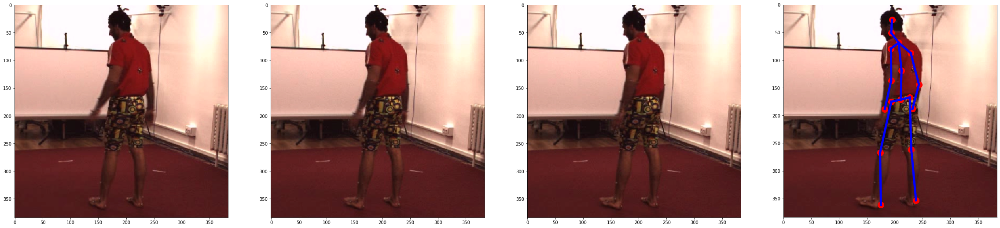

In [81]:
# offset = 5
# fig, axes = plt.subplots(ncols=4, nrows=1, figsize=(40,10))
# for i,ax in enumerate(axes):
#     image = series['images'][offset+i:offset+i+1][0]
#     proj_matrix = series['proj_matrices'][offset+i:offset+i+1][0]
#     keypoints_3d = series['keypoints_gt'][offset+i:offset+i+1][0]
    
#     ax.imshow(image)
#     if i == 3:
#         image_shape = image.shape[:2]

#         keypoints_2d_wrt_new = multiview.project_3d_points_to_image_plane_without_distortion(proj_matrix,
#                                                                                              keypoints_3d)
# #         keypoints_2d_wrt_orig = transform_points_after_crop_and_resize(keypoints_2d_wrt_new, (bbox[0], bbox[1]), image_shape_before_resize, image_shape, forward=True)
#         draw_2d_pose(keypoints_2d_wrt_new, ax, kind='human36m', point_size=200, line_width=5)
#         ax.set_xlim(0, image.shape[1])
#         ax.set_ylim(0, image.shape[0])
#         ax.invert_yaxis()
#         ax.scatter(keypoints_2d_wrt_new[:, 0], keypoints_2d_wrt_new[:, 1], s=10, c='red')
        


# Post processing

In [22]:
from scipy.signal import savgol_filter, savgol_coeffs
n_joints = series['keypoints'].shape[1]
series['keypoints_smoothed'] = []
for i in range(n_joints):
    joint_coord_sequence = series['keypoints'][:,i]
    series['keypoints_smoothed'] += [savgol_filter(joint_coord_sequence, window_length=25, polyorder = 2, axis=0)]
series['keypoints_smoothed'] = np.stack(series['keypoints_smoothed'], 1)

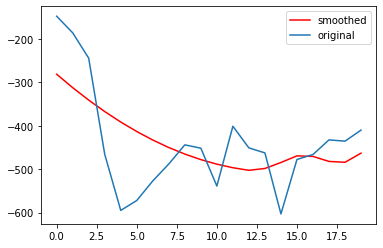

In [23]:
coord=1
joint = 3
plt.plot(series['keypoints_smoothed'][:,joint,coord][:20],'r', label='smoothed')
plt.plot(series['keypoints'][:,joint,coord][:20], label='original')
plt.legend()

# Plot jitter

In [28]:
# gt_diffs,model_diffs_smoothed = get_diffs(series['keypoints_gt'], series['keypoints_smoothed'])
# _,model_diffs = get_diffs(series['keypoints_gt'], series['keypoints'])

# plt.plot(model_diffs, 'r', label='pred diffs')
# plt.plot(model_diffs_smoothed, 'g',label='pred diffs smoothed')
# plt.plot(gt_diffs, label='GT diffs')
# plt.legend()

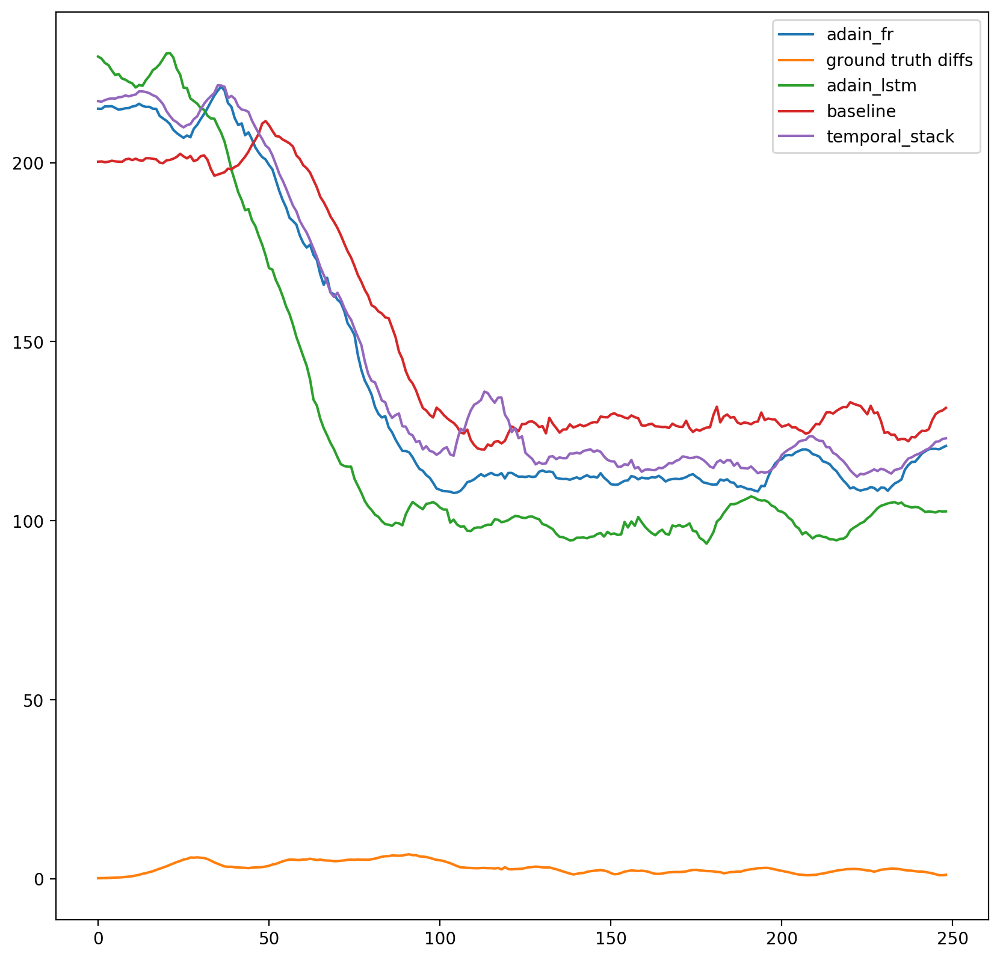

In [180]:
# plt.figure(figsize=(10,10), dpi=200)
# for name in ['adain_fr',  'adain_lstm',  'baseline',  'temporal_stack']:
    
#     series = np.load(name + '.npy', allow_pickle=True).item()
#     gt_diffs,model_diffs = get_diffs(series['keypoints_gt'], series['keypoints'])

#     plt.plot(model_diffs, label=name)
#     if name == 'adain_fr':
#         plt.plot(gt_diffs, label='ground truth diffs')
#     plt.legend()

# Make Video

In [15]:
video_path = os.path.join('videos/',experiment_type, experiment_name)
if not os.path.isdir(video_path):
    os.mkdir(video_path)
else:
    print ('Already exists')

Already exists


In [16]:
experiment_type, experiment_name

('adain_lstm',
 'h36_sv64_dist_adain-lstm-middle-groupnorm_distrib-2_f2v-backbone-C2-1024_dt-8_dil-3_bs-1-1_lr-1e-4@08.01.2020-18:49:37')

In [17]:
keypoints_dir = os.path.join(video_path,'{0}_{1}'.format(subject, action),'keypoints_videos_lowres')
if not os.path.isdir(keypoints_dir):
    os.makedirs(keypoints_dir)
else:
    print ('Already exists')    

Already exists


In [18]:
keypoints_dir

'videos/adain_lstm/h36_sv64_dist_adain-lstm-middle-groupnorm_distrib-2_f2v-backbone-C2-1024_dt-8_dil-3_bs-1-1_lr-1e-4@08.01.2020-18:49:37/S9_Directions-1/keypoints_videos_lowres'

In [ ]:
# os.system("rm ./{}/*".format(keypoints_dir))
smoothed = False
with_gt = True

for i in tqdm_notebook(range(length)):

    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (45,45))

    # unpack
    image = series['images'][i]
    proj_matrice = series['proj_matrices'][i]
    keypoints_3d_gt = series['keypoints'][i] if smoothed else series['keypoints_gt'][i]
    keypoints_3d_pred = series['keypoints_smoothed'][i] if smoothed else series['keypoints'][i]

    ax[0].imshow(image)
    ax[1].imshow(image)

    # predicted keypoints
    keypoints_2d_gt_proj = project_3d_points_to_image_plane_without_distortion(proj_matrice,
                                                                                keypoints_3d_pred)
    draw_2d_pose(keypoints_2d_gt_proj, ax[0], kind='human36m', point_size=200, line_width=5)

    # ground-truth
    keypoints_2d_gt_proj = project_3d_points_to_image_plane_without_distortion(proj_matrice,
                                                                           keypoints_3d_gt)
    draw_2d_pose(keypoints_2d_gt_proj, ax[1], kind='human36m', point_size=200, line_width=5)

    ax[1].set_title('Predicted' if smoothed else 'GT')
    ax[0].set_title('Smoothed' if smoothed else 'Predicted')
    plt.savefig('./{}/img_{:05}.jpg'.format(keypoints_dir, i), bbox_inches='tight')
    plt.close()
        

In [24]:
with_gt, discr, smoothed = True, False, False
os.system("ffmpeg -framerate 25 -i keypoints_videos_lowres/img_%05d.jpg -vcodec mpeg4 -y {6}/movie_{0}_{1}_{2}_f{3}_{4}_{5}.mp4".format(*index_to_name(start+length, stop_frame_indxs),
                                                                                                                                                   '_with_gt' if with_gt else '',
                                                                                                                                                   length,
                                                                                                                                                   'sovgol' if smoothed else '',
                                                                                                                                                   'tempdiscr' if discr else '',
                                                                                                                                                    video_path))        

256

In [23]:
("ffmpeg -framerate 25 -i keypoints_videos_lowres/img_%05d.jpg -vcodec mpeg4 -y {6}/movie_{0}_{1}_{2}_f{3}_{4}_{5}.mp4".format(*index_to_name(start+length, stop_frame_indxs),
                                                                                                                                                   '_with_gt' if with_gt else '',
                                                                                                                                                   length,
                                                                                                                                                   'sovgol' if smoothed else '',
                                                                                                                                                   'tempdiscr' if discr else '',
                                                                                                                                                    video_path))   

'ffmpeg -framerate 25 -i keypoints_videos_lowres/img_%05d.jpg -vcodec mpeg4 -y videos/adain_lstm/h36_sv64_dist_adain-lstm-middle-groupnorm_distrib-2_f2v-backbone-C2-1024_dt-8_dil-3_bs-1-1_lr-1e-4@08.01.2020-18:49:37/movie_S9_Directions-1__with_gt_f1000__.mp4'

# CMU

In [129]:
# hd_pose_path = '/media/hpc2_storage/ibulygin/CMU_data/panoptic-toolbox/171204_pose3/hdPose3d_stage1_coco19/body3DScene_00009056.json'
# with open(hd_pose_path) as fin:
#     hd_pose = json.load(fin)

# keypoints_3d_pose = np.array(hd_pose['bodies'][0]['joints19']).reshape((-1, 4))

In [12]:
# scene_path = "/home/user/datasets/cmu-sample/171026_pose3"

# train_dataset = CMUSceneDataset(
#     scene_path,
#     return_keypoints_3d=True,
#     base_camera_name="00_00",
#     ignore_list=["00_09", "00_10", "00_11", "00_12", "00_13", "00_14", "00_15", "00_16", "00_17", "00_18", "00_19", "00_20", "00_21", "00_22", "00_23", "00_24", "00_25", "00_26", "00_27", "00_28", "00_29", "00_30", "00_31"]
# #     ignore_list=["00_02", "00_03", "00_04", "00_05", "00_06", "00_07", "00_08", "00_09", "00_10", "00_11", "00_12", "00_13", "00_14", "00_15", "00_16", "00_17", "00_18", "00_19", "00_20", "00_21", "00_22", "00_23", "00_24", "00_25", "00_26", "00_27", "00_28", "00_29", "00_30", "00_31"]
# )
# train_dataset = nonechucks.SafeDataset(train_dataset)

# train_dataloader = nonechucks.SafeDataLoader(
#     train_dataset,
#     batch_size=2,
#     shuffle=True,
#     collate_fn=CMUSceneDataset.collate_fn
# )

TypeError: __init__() got an unexpected keyword argument 'return_keypoints_3d'

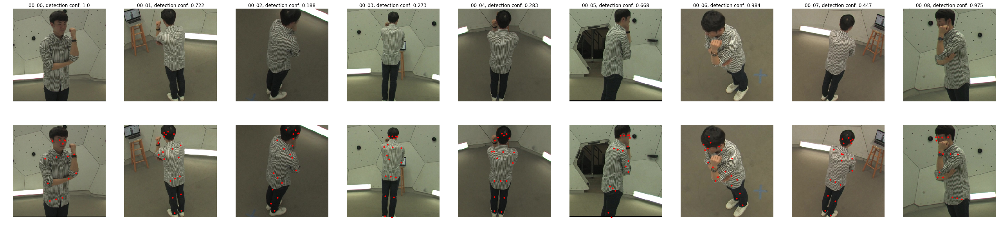

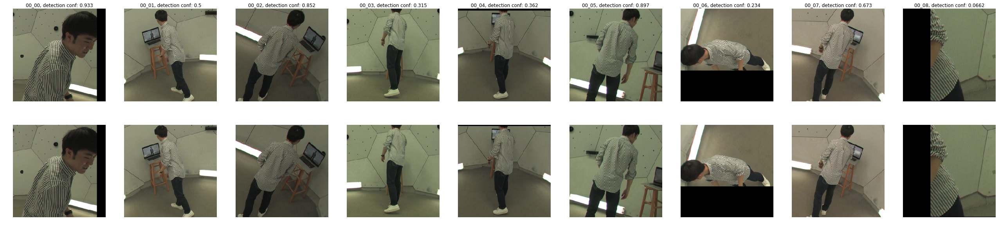

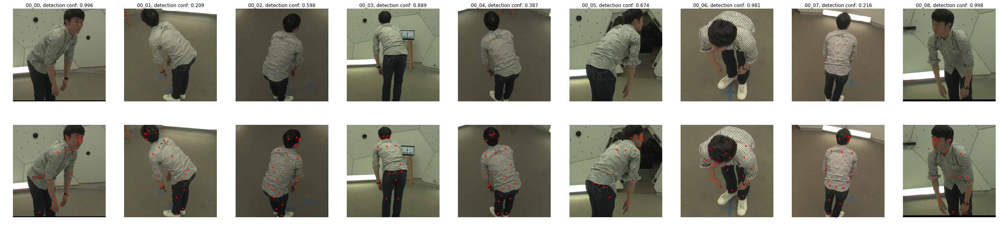

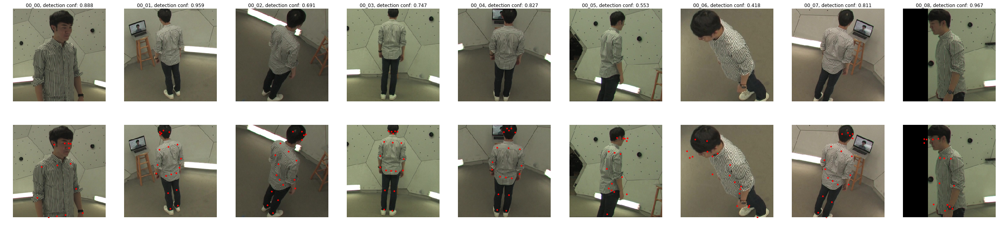

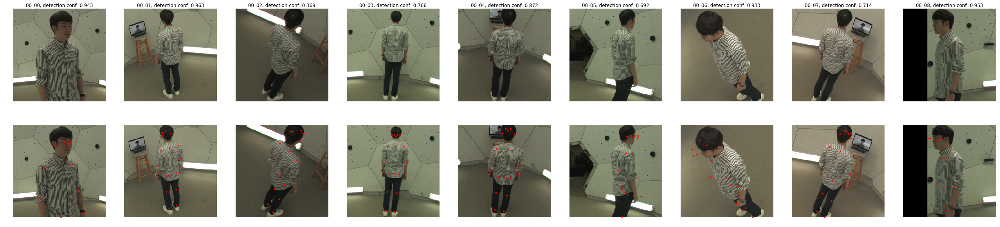

In [10]:
# n_batches_to_show = 5
# for i, batch in zip(range(n_batches_to_show), train_dataloader):
#     n_views = len(batch['images'])
#     batch_size = batch['images'][0].shape[0]
    
#     fig, axes = plt.subplots(ncols=n_views, nrows=2, figsize=(5 * n_views, 2 * 5))
#     for i in range(n_views):
#         # first row
#         detection = batch['detections'][i][0]
#         *bbox, c = detection
        
#         image = batch['images'][i][0]
#         image = image.transpose(1, 2, 0)
#         axes[0][i].imshow(image)
        
#         camera_name = batch['cameras'][i][0].name
#         title = "{}, detection conf: {:.3}".format(camera_name, c)
#         axes[0][i].set_title(title)
        
#         axes[0][i].axis('off')
        
#         # second row
#         keypoints_3d = batch['keypoints_3d'][0][:19][:, :3]
#         proj_matrix = batch['cameras'][i][0].projection
#         image_shape_before_resize = batch['image_shapes_before_resize'][i][0]
#         image_shape = image.shape[:2]

#         keypoints_2d_wrt_new = multiview.project_3d_points_to_image_plane_without_distortion(proj_matrix, keypoints_3d)
#         keypoints_2d_wrt_orig = transform_points_after_crop_and_resize(keypoints_2d_wrt_new, (bbox[0], bbox[1]), image_shape_before_resize, image_shape, forward=True)
        
        
#         axes[1][i].set_xlim(0, image.shape[1])
#         axes[1][i].set_ylim(0, image.shape[0])
#         axes[1][i].invert_yaxis()
#         axes[1][i].imshow(image)
#         axes[1][i].scatter(keypoints_2d_wrt_orig[:, 0], keypoints_2d_wrt_orig[:, 1], s=10, c='red')
        
#         axes[1][i].axis('off')
        
#     plt.show()